# Annotation pipeline

We here provide the pipeline to load the various segmentation schemes to AnnData and perform cell-typing. We show the code to perform annotation transfer between the different segmentation schemes.

In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.insert(0,'/home/cane/Documents/yoseflab/can/resolVI')
from scvi.external import RESOLVI

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Imports

In [2]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import sys
import scvi
from scvi.model import CondSCVI, DestVI
import anndata
import gc
import parc
import seaborn as sns

2024-07-18 18:41:55.502079: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
sns.reset_orig()
sc.settings._vector_friendly = True
# p9.theme_set(p9.theme_classic)
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["savefig.transparent"] = True
plt.rcParams["figure.figsize"] = (4, 4)

plt.rcParams["axes.titlesize"] = 15
plt.rcParams["axes.titleweight"] = 500
plt.rcParams["axes.titlepad"] = 8.0
plt.rcParams["axes.labelsize"] = 14
plt.rcParams["axes.labelweight"] = 500
plt.rcParams["axes.linewidth"] = 1.2
plt.rcParams["axes.labelpad"] = 6.0
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False

plt.rcParams["font.size"] = 11
# plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', "Computer Modern Sans Serif", "DejaVU Sans"]
plt.rcParams['font.weight'] = 500

plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['xtick.minor.size'] = 1.375
plt.rcParams['xtick.major.size'] = 2.75
plt.rcParams['xtick.major.pad'] = 2
plt.rcParams['xtick.minor.pad'] = 2

plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['ytick.minor.size'] = 1.375
plt.rcParams['ytick.major.size'] = 2.75
plt.rcParams['ytick.major.pad'] = 2
plt.rcParams['ytick.minor.pad'] = 2

plt.rcParams["legend.fontsize"] = 12
plt.rcParams['legend.handlelength'] = 1.4
plt.rcParams['legend.numpoints'] = 1
plt.rcParams['legend.scatterpoints'] = 3

plt.rcParams['lines.linewidth'] = 1.7
DPI = 300

In [4]:
from scipy.sparse import csr_matrix as csr

## Load input data

### Original

In [1]:
import tiledbsoma
import tiledb
import pandas as pd
config = tiledb.Config()
ctx = tiledb.Ctx(config)

In [2]:
pySoma = tiledbsoma.SOMACollection('/external_data/other/resolvi_final_other_files/Nanostring_liver/LiverDataRelease', ctx=ctx)

In [20]:
nanostring = anndata.AnnData(
    X=pySoma['RNA'].X['counts'].csr(), obs=pySoma['RNA'].obs.df(), var=pySoma['RNA'].var.df()
)

In [25]:
pd.options.display.max_rows = 200

In [27]:
nanostring.obs.iloc[0]

RNA_pca_cluster_default                16
RNA_pca_cluster_default.1              20
orig.ident                              c
nCount_RNA                          142.0
nFeature_RNA                           77
nCount_negprobes                      0.0
nFeature_negprobes                      0
nCount_falsecode                      0.0
nFeature_falsecode                      0
fov                                   100
Area                                 5023
AspectRatio                          1.18
Width                                  86
Height                                 73
Mean.PanCK                            110
Max.PanCK                             578
Mean.CK8.18                             0
Max.CK8.18                              0
Mean.Membrane                          21
Max.Membrane                          345
Mean.CD45                               9
Max.CD45                              134
Mean.DAPI                            4294
Max.DAPI                          

In [28]:
nanostring.obs['slideID'] = nanostring.obs['slide_ID_numeric']
nanostring.obsm['spatial'] = nanostring.obs[['x_slide_mm', 'y_slide_mm']].values

NormalLiver


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


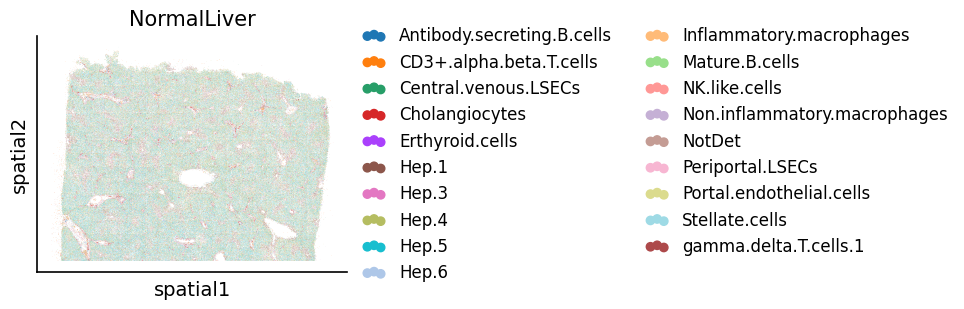

CancerousLiver


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


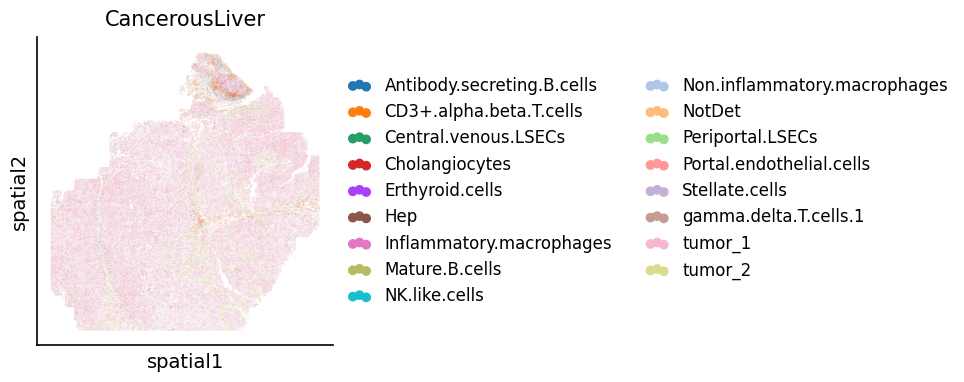

In [29]:
for i in nanostring.obs['Run_Tissue_name'].unique():
    print(i)
    sc.pl.spatial(nanostring[nanostring.obs['Run_Tissue_name']==i], color='cellType', spot_size=0.01, alpha=1.0, title=i)

In [30]:
nanostring.obs['cluster'] = nanostring.obs['cellType'].astype(str).replace('NotDet', 'unassigned')
nanostring.obs['fov_batch'] = nanostring.obs['fov'].astype(str) + nanostring.obs['Run_Tissue_name'].astype(str)

In [31]:
nanostring = nanostring[nanostring.obs.groupby('fov_batch').filter(lambda x: len(x) >= 30).index]

In [32]:
nanostring.write_h5ad('nanostring_liver_original.h5ad')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


### Positions file

In [7]:
coordinates = tiledb.open_dataframe(pySoma['RNA'].obsm["transcriptCoords"].uri, ctx=ctx)

In [18]:
pd.options.display.max_rows = 300

In [9]:
positions = pd.read_csv('fov_position_file.csv')
positions.sort_values('FOV', inplace=True)

In [11]:
coordinates = pd.merge(coordinates, positions[['Slide', 'FOV', 'X_mm', 'Y_mm', 'Z_mm']], left_on=['slideID', 'fov'], right_on=['Slide', 'FOV'], how='left')

In [12]:
coordinates['y_mm'] = coordinates['y_FOV_px'] / 8333.33
coordinates['x_mm'] = - coordinates['x_FOV_px'] / 8333.33
coordinates['x'] = coordinates['X_mm'] + coordinates['x_mm']
coordinates['y'] = coordinates['Y_mm'] + coordinates['y_mm']

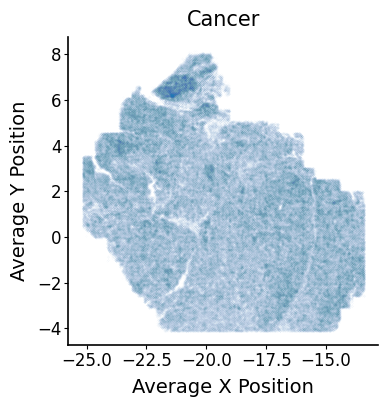

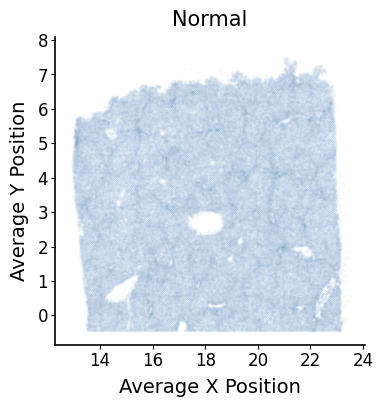

In [14]:
grouped = coordinates.loc[np.logical_and(coordinates['slideID']==2, coordinates['CellComp']=='Nuclear'), ['cell_id', 'x', 'y']].groupby('cell_id').mean()
plt.scatter(grouped['x'], grouped['y'], s=0.0001)
plt.xlabel('Average X Position')
plt.ylabel('Average Y Position')
plt.title('Cancer')
plt.show()
grouped = coordinates.loc[np.logical_and(coordinates['slideID']==1, coordinates['CellComp']=='Nuclear'), ['cell_id', 'x', 'y']].groupby('cell_id').mean()
plt.scatter(grouped['x'], grouped['y'], s=0.0001)
plt.xlabel('Average X Position')
plt.ylabel('Average Y Position')
plt.title('Normal')
plt.show()

In [16]:
coordinates = coordinates.drop(['X_mm', 'Y_mm', 'Z_mm', 'x_mm', 'y_mm', 'FOV', 'Slide'], axis=1)
coordinates.head()

,slideID,fov,x_FOV_px,y_FOV_px,z_FOV_slice,target,CellId,cell_id,CellComp,Slide,FOV,y_mm,x_mm,x,y
0,1,12,171,9,6,PTK2,19,c_1_12_19,Cytoplasm,1.0,12.0,0.00108,-0.02052,17.87248,-0.45592
1,1,4,659,9,7,APOA1,3,c_1_4_3,Cytoplasm,1.0,4.0,0.00108,-0.07908,21.90892,-0.45592
2,1,4,759,9,6,TPT1,3,c_1_4_3,Cytoplasm,1.0,4.0,0.00108,-0.09108,21.89692,-0.45592
3,1,8,1006,9,7,APOA1,26,c_1_8_26,Nuclear,1.0,8.0,0.00108,-0.12072,19.82028,-0.45592
4,1,6,1129,9,3,TPT1,7,c_1_6_7,Cytoplasm,1.0,6.0,0.00108,-0.13548,20.82852,-0.45592


In [ ]:
coordinates.to_parquet('all_coordinates_sub.parquet')

In [ ]:
## OLD

for ind, i in enumerate(positions['Slide'].unique()):
    for ind, x_pos, y_pos in positions.loc[positions['Slide']==i, ['FOV', 'X_mm', 'Y_mm']].values:
        nanostring.obs.loc[np.logical_and(nanostring.obs['slideID']==i, nanostring.obs['fov']==ind), 'y_px_slide'] = - (y_pos + nanostring.obs.loc[
            np.logical_and(nanostring.obs['slideID']==i, nanostring.obs['fov']==ind), 'y_mm'])
        nanostring.obs.loc[np.logical_and(nanostring.obs['slideID']==i, nanostring.obs['fov']==ind), 'x_px_slide'] = - (x_pos - nanostring.obs.loc[
            np.logical_and(nanostring.obs['slideID']==i, nanostring.obs['fov']==ind), 'x_mm'])

In [ ]:
pd.options.display.max_rows = 100

### ProSeg

In [47]:
folder = '/data/extra_files/Nanostring_liver/proseg/'

In [49]:
proseg = {}
proseg['cancer'] = anndata.AnnData(
    X=pd.read_csv(f'{folder}/proseg_cancer/expected-counts.csv.gz'))
proseg['cancer'].X = csr(proseg['cancer'].X)
proseg['healthy'] = anndata.AnnData(
    X=pd.read_csv(f'{folder}/proseg_healthy/expected-counts.csv.gz'))
proseg['healthy'].X = csr(proseg['healthy'].X)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [51]:
for i in proseg:
    cell_meta = pd.read_csv(
        f'{folder}/proseg_{i}/transcript-metadata.csv.gz')
    cell_meta = cell_meta # [cell_meta['background']==0]
    cell_avg = cell_meta.groupby('assignment').mean()
    cell_avg = cell_avg.loc[proseg[i].obs.index.astype(int).intersection(cell_avg.index)]
    cell_avg.index = [str(i) for i in cell_avg.index]
    proseg[i] = proseg[i][cell_avg.index]
    proseg[i].obs = cell_avg
    cell_meta['v'] = np.ones(cell_meta.shape[0], int)
    counts = cell_meta[['assignment', 'gene', 'v']].groupby(['assignment', 'gene']).sum().pivot_table(
        'v', index='assignment', columns='gene').fillna(0)
    proseg[i].layers['counts'] = csr(counts.loc[proseg[i].obs_names.astype(int), proseg[i].var_names])
    counts_sub_ = cell_meta.loc[cell_meta['background']==0, ['assignment', 'gene', 'v']].groupby(
        ['assignment', 'gene']).sum().pivot_table('v', index='assignment', columns='gene').fillna(0)
    counts_sub = 0. * counts
    counts_sub.loc[counts_sub_.index, counts_sub_.columns] = counts_sub_
    proseg[i].layers['counts_wo_bg'] = csr(counts_sub.loc[proseg[i].obs_names.astype(int), proseg[i].var_names])
    del counts, counts_sub_, counts_sub, cell_meta

/tmp/ipykernel_420899/3017557735.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cell_avg = cell_meta.groupby('assignment').mean()
/tmp/ipykernel_420899/3017557735.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cell_avg = cell_meta.groupby('assignment').mean()


In [52]:
proseg_concat = anndata.concat(list(proseg.values()), label='health', keys=list(proseg.keys()), join='outer', fill_value=0)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [7]:
proseg_concat.obsm['X_spatial'] = proseg_concat.obs[['x', 'y']].values

In [10]:
proseg_concat.obs['health'].value_counts()

cancer     448939
healthy    293630
Name: health, dtype: int64

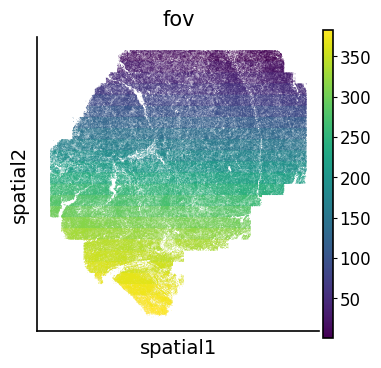

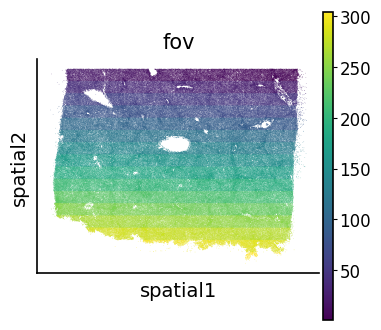

In [11]:
sc.pl.spatial(proseg_concat[proseg_concat.obs['health']=='cancer'], color='fov', spot_size=20, alpha=1.0)
sc.pl.spatial(proseg_concat[proseg_concat.obs['health']=='healthy'], color='fov', spot_size=20, alpha=1.0)

In [12]:
proseg_concat.write_h5ad('nanostring_liver_proseg.h5ad')

### Baysor

In [5]:
import glob

In [6]:
import re

files = glob.glob(f'baysor_transcripts/normal/segmentation_m50_fov_*[0-9].csv')

In [ ]:
adata = {}

for slide in ['cancer', 'normal']:
    print(slide)
    files = glob.glob(f'baysor_transcripts/{slide}/segmentation_m50_fov_*[0-9].csv')
    files_dict = {int(re.search('fov_(\d+)', file).group(1)):file for file in files}
    for key, value in files_dict.items():
        fov_slide = slide + '__' + str(key)
        print(fov_slide)
        files = glob.glob('baysor_transcripts/{slide}/segmentation_m50_fov_*[0-9].csv')
        files_dict = {int(re.search('fov_(\d+)', file).group(1)):file for file in files}
        df = pd.read_csv(value)
        df["v"] = np.ones(df.shape[0], int)
        df = df[df['is_noise']==False]
        df['cell'] = df['cell'].astype(str)
        adata[fov_slide] = sc.AnnData(df[['cell', 'gene', 'v']].groupby(['cell', 'gene']).sum().pivot_table('v', index='cell', columns='gene').fillna(0).iloc[1:])
        df = pd.read_csv(f'baysor_transcripts/{slide}/segmentation_m50_fov_' + str(key) + '_cell_stats.csv', index_col='cell')
        indices = np.intersect1d(df.index, adata[fov_slide].obs_names.astype(int))
        adata[fov_slide] = adata[fov_slide][indices.astype(str)]
        adata[fov_slide].obs = df.loc[indices]
        adata[fov_slide].obs_names = slide + '__' + str(key) + '__' + adata[fov_slide].obs_names.astype(str)
baysor = anndata.concat(list(adata.values()), label='fov_slide', keys=list(adata.keys()), join='outer', fill_value=0)

In [10]:
baysor.obs[['health', 'fov_original']] = baysor.obs['fov_slide'].str.split('__', expand=True)

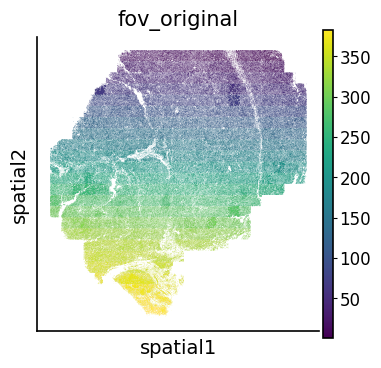

In [14]:
baysor.obsm['X_spatial'] = baysor.obs[['x', 'y']].values/1000.
baysor.obs['fov_original'] = baysor.obs['fov_original'].astype(int)
sc.pl.spatial(baysor[baysor.obs['health']=='cancer'], color='fov_original', spot_size=0.01, alpha=1.0)

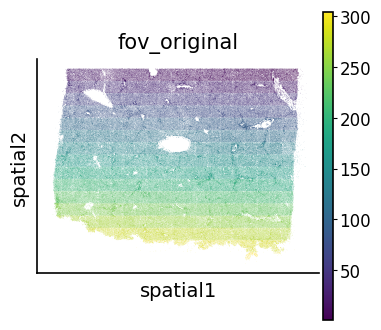

In [15]:
sc.pl.spatial(baysor[baysor.obs['health']=='normal'], color='fov_original', spot_size=0.01, alpha=1.0)

In [16]:
baysor.write_h5ad('nanostring_liver_baysor.h5ad')

## Downstream

### ProSeg

In [5]:
ls /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/

baysor_newest_bg/
baysor_newest_bg_semisupervised/
original_newest_bg/
original_newest_bg_semisupervised/
original_newest_semisupervised_insitutype_newest/
original_newest_semisupervised_insitutype_redo/
proseg_newest_bg/
proseg_newest_bg_semisupervised/


In [6]:
model_path = '/home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/original_newest_semisupervised_insitutype_newest/resolvae'
resolvi_semisupervised = RESOLVI.load(model_path)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/original_newest_semisupervised_insi
         tutype_newest/resolvae/model.pt already downloaded                                                        


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/cudf/utils/_numba.py:110: UserWarning: Using CUDA toolkit version (12, 5) with CUDA driver version (12, 4) requires minor version compatibility, which is not yet supported for CUDA driver versions 12.0 and above. It is likely that many cuDF operations will not work in this state. Please install CUDA toolkit version (12, 4) to continue using cuDF.
  warnings.warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For cre

Epoch 1/50:   2%|▏         | 1/50 [00:00<00:24,  2.03it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:24,  1.97it/s, v_num=1]


In [7]:
proseg = sc.read_h5ad('nanostring_liver_proseg.h5ad')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [8]:
proseg.layers['estimated'] = proseg.X.copy()
proseg.layers['raw_counts'] = proseg.layers['counts'].copy()

In [9]:
RESOLVI.prepare_query_anndata(proseg, model_path)
proseg = proseg[proseg.layers['raw_counts'].sum(1)>5].copy()

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/original_newest_semisupervised_insi
         tutype_newest/resolvae/model.pt already downloaded                                                        
INFO     Found 100.0% reference vars in query data.                                                                


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [10]:
proseg.obs['fov_batch'] = 'query' + proseg.obs['health'].astype(str) + proseg.obs['fov'].astype(str)

In [11]:
proseg.obsm['spatial'] = proseg.obsm['X_spatial'] 

In [12]:
proseg.obs_names_make_unique()

In [13]:
proseg = proseg[proseg.obs.groupby('fov_batch').filter(lambda x: len(x) >= 30).index]

In [14]:
proseg.obsm['spatial'] = proseg.obsm['X_spatial'] = proseg.obs[['x', 'y']].values/1000.

/tmp/ipykernel_3598676/2624132696.py:1: ImplicitModificationWarning: Setting element `.obsm['spatial']` of view, initializing view as actual.
  proseg.obsm['spatial'] = proseg.obsm['X_spatial'] = proseg.obs[['x', 'y']].values/1000.


In [15]:
proseg.obs_names = ['query_' + i for i in proseg.obs_names]
resolvi_transfer = RESOLVI.load_query_data(
    proseg,
    model_path,
)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/original_newest_semisupervised_insi
         tutype_newest/resolvae/model.pt already downloaded                                                        


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 793276 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
/home/cane/Documents/yoseflab/can/resolVI/scvi/data/_manager.py:212: UserWarning: Missing labels key cluster. Filling in with unlabeled category NotDet.
  field_registry[_constants._STATE_REGISTRY_KEY] = field.transfer_field(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:29,  1.65it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:30,  1.60it/s, v_num=1]


In [18]:
proseg.obsm['celltype_transfer'] = resolvi_transfer.predict(soft=True, num_samples=3, batch_size=5000)
proseg.obs['predicted_celltype'] = proseg.obsm['celltype_transfer'].idxmax(axis=1)
proseg.obs['predicted_celltype_prob'] = proseg.obsm['celltype_transfer'].max(axis=1)

Sampling macro-batches, batch:   0%|          | 0/14 [00:00<?, ?it/s]

Sampling macro-batches, batch: 100%|██████████| 14/14 [39:25<00:00, 168.95s/it]


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


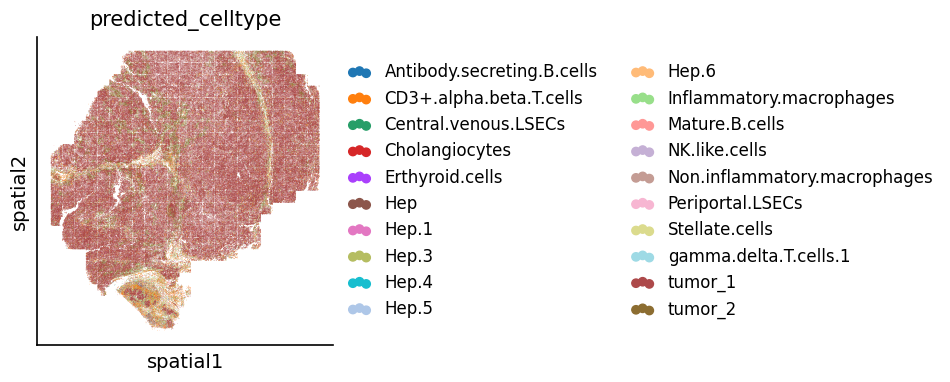

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


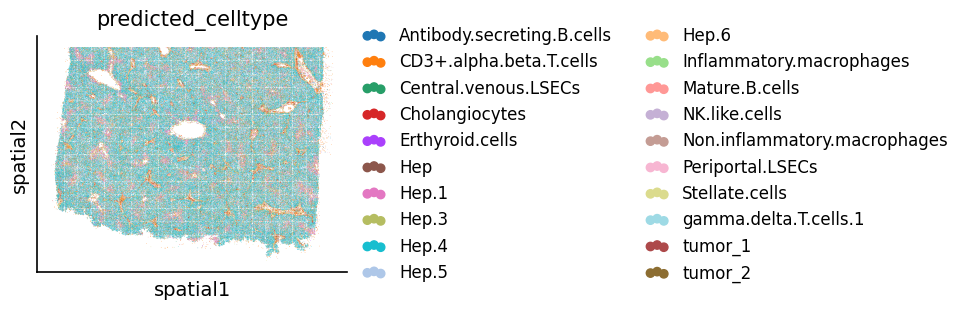

In [19]:
sc.pl.spatial(proseg[proseg.obs['health']=='cancer'], color='predicted_celltype', spot_size=0.02, alpha=1.0)
sc.pl.spatial(proseg[proseg.obs['health']=='healthy'], color='predicted_celltype', spot_size=0.02, alpha=1.0)

In [20]:
proseg.obsm['X_resolvi'] = resolvi_transfer.get_latent_representation()

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


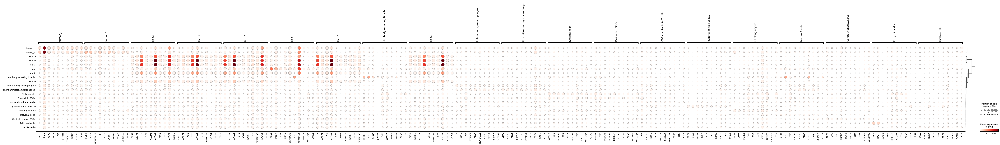

In [21]:
sc.tl.rank_genes_groups(proseg, groupby='predicted_celltype', method='wilcoxon', n_genes=10)
sc.pl.rank_genes_groups_dotplot(proseg, n_genes=10, groupby='predicted_celltype')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


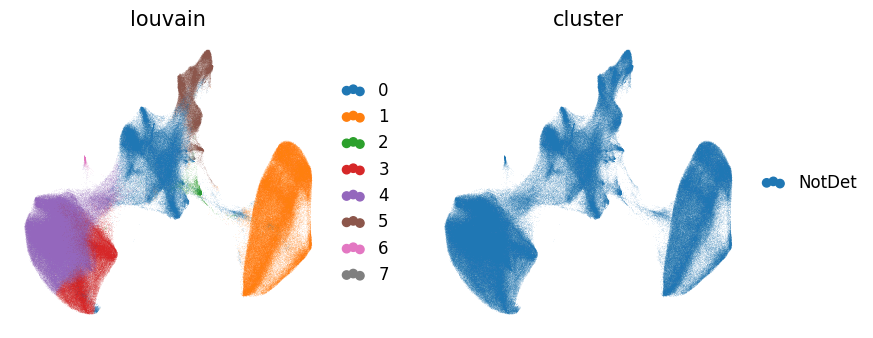

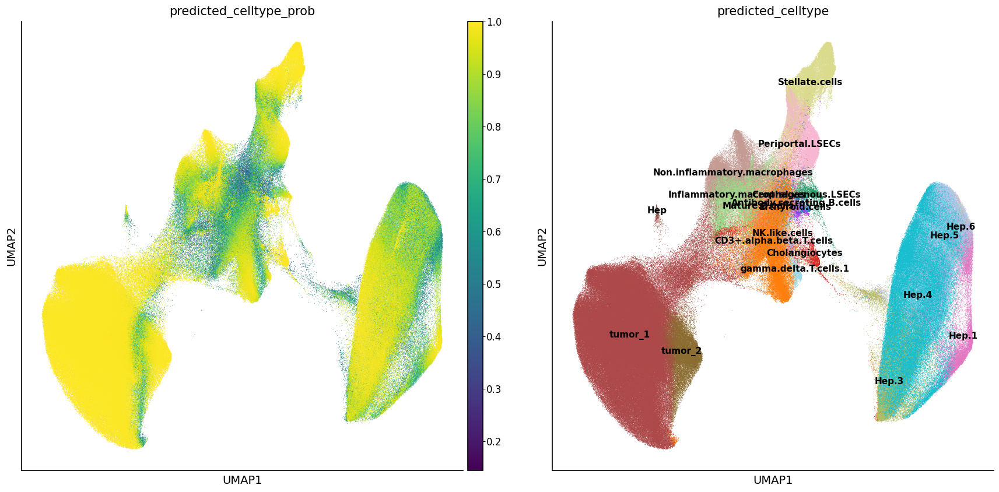

In [22]:
sys.path.append('/home/cane/Documents/yoseflab/can/resolvi_eval_final2')
import _utils
try:
    _utils.compute_umap_embedding(proseg, representation_key="X_resolvi", n_comps=None, show=True, n_neighbors=20, min_dist_umap=0.2, extra_save='transferred_latent')
except:
    with plt.rc_context({'figure.figsize': (10, 10)}):
        sc.pl.umap(proseg, color=['predicted_celltype_prob', 'predicted_celltype'], legend_loc='on data', size=2)

In [26]:
proseg.obsm['X_umap_transferred'] = proseg.obsm['X_umap']
proseg.obsm['X_resolvi_transferred'] = proseg.obsm['X_resolvi']

Sampling macro-batches, batch:   0%|          | 0/23 [00:00<?, ?it/s]

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


Sampling macro-batches, batch: 100%|██████████| 23/23 [30:23<00:00, 79.29s/it]


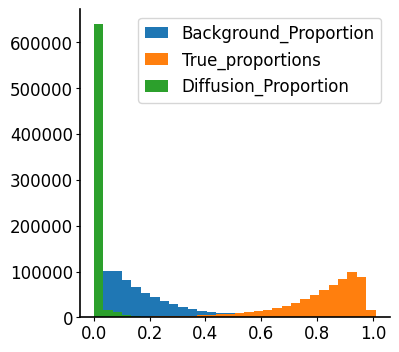

In [27]:
samples = resolvi_transfer.sample_posterior_predictive(
    model=resolvi_transfer.module.model_residuals,
    return_sites=['mixture_proportions'],
    num_samples=3, return_samples=False, batch_size=5000, macro_batch_size=30000)
samples = pd.DataFrame(samples).T

proseg.obs['true_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 0]
proseg.obs['diffusion_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 1]
proseg.obs['background_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 2]

_ = plt.hist(proseg.obs['background_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['true_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['diffusion_proportion_transfer'], bins=30, range=(0,1.01))
plt.legend(['Background_Proportion', 'True_proportions', 'Diffusion_Proportion'])
plt.savefig(f'proseg_histogram_proportions.pdf')
plt.show()

In [28]:
proseg.write_h5ad('nanostring_liver_proseg_processed.h5ad')

In [29]:
proseg = sc.read('nanostring_liver_proseg_processed.h5ad')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [30]:
proseg = proseg[proseg.layers['raw_counts'].sum(1)>20].copy()
proseg.write_h5ad('nanostring_liver_proseg_processed_new.h5ad')

### Baysor

In [5]:
model_path = '/home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/original_newest_semisupervised_insitutype_newest/resolvae'
resolvi_semisupervised = RESOLVI.load(model_path)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/original_newest_semisupervised_insi
         tutype_newest/resolvae/model.pt already downloaded                                                        


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/cudf/utils/_numba.py:110: UserWarning: Using CUDA toolkit version (12, 5) with CUDA driver version (12, 4) requires minor version compatibility, which is not yet supported for CUDA driver versions 12.0 and above. It is likely that many cuDF operations will not work in this state. Please install CUDA toolkit version (12, 4) to continue using cuDF.
  warnings.warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For cre

Epoch 1/50:   2%|▏         | 1/50 [00:00<00:15,  3.19it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:15,  3.07it/s, v_num=1]


In [6]:
proseg = sc.read_h5ad('nanostring_liver_baysor.h5ad')

In [7]:
proseg.X = csr(proseg.X)
proseg.layers['raw_counts'] = proseg.X.copy()

In [8]:
RESOLVI.prepare_query_anndata(proseg, model_path)
proseg = proseg[proseg.layers['raw_counts'].sum(1)>5].copy()

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/original_newest_semisupervised_insi
         tutype_newest/resolvae/model.pt already downloaded                                                        
INFO     Found 100.0% reference vars in query data.                                                                


In [9]:
proseg.obs['fov_batch'] = 'query' + proseg.obs['health'].astype(str) + proseg.obs['fov_original'].astype(str)

In [10]:
proseg.obsm['spatial'] = proseg.obsm['X_spatial']

In [11]:
proseg = proseg[proseg.obs.groupby('fov_batch').filter(lambda x: len(x) >= 30).index]

In [12]:
proseg.obs_names = ['query_' + i for i in proseg.obs_names]
resolvi_transfer = RESOLVI.load_query_data(
    proseg,
    model_path,
)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/original_newest_semisupervised_insi
         tutype_newest/resolvae/model.pt already downloaded                                                        


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 793276 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
/home/cane/Documents/yoseflab/can/resolVI/scvi/data/_manager.py:212: UserWarning: Missing labels key cluster. Filling in with unlabeled category NotDet.
  field_registry[_constants._STATE_REGISTRY_KEY] = field.transfer_field(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:18,  2.69it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:18,  2.63it/s, v_num=1]


In [13]:
proseg.obsm['celltype_transfer'] = resolvi_transfer.predict(soft=True, num_samples=3, batch_size=5000)
proseg.obs['predicted_celltype'] = proseg.obsm['celltype_transfer'].idxmax(axis=1)
proseg.obs['predicted_celltype_prob'] = proseg.obsm['celltype_transfer'].max(axis=1)

Sampling macro-batches, batch:   0%|          | 0/24 [00:00<?, ?it/s]

Sampling macro-batches, batch: 100%|██████████| 24/24 [44:57<00:00, 112.39s/it]


In [14]:
def most_frequent_celltype(group):
    most_frequent = group['predicted_celltype'].value_counts().idxmax()
    ratio = group['predicted_celltype'].value_counts().max() / len(group)
    return pd.Series([most_frequent, ratio], index=['most_frequent_celltype', 'ratio'])

# Apply the function to each fov_original
result = proseg.obs.loc[proseg.obs['health']=='cancer', ['fov_original', 'predicted_celltype']].groupby('fov_original').apply(most_frequent_celltype)

# Reset the index
result.reset_index(inplace=True)

In [15]:
proseg.obs['predicted_celltype'].value_counts()

tumor_1                         468608
Hep.4                           139229
CD3+.alpha.beta.T.cells         114362
Hep.5                            79646
Periportal.LSECs                 60252
Stellate.cells                   54316
Non.inflammatory.macrophages     48300
Inflammatory.macrophages         46846
tumor_2                          44216
Cholangiocytes                   30277
Hep.1                            28636
Hep.3                            24325
Mature.B.cells                   14912
Central.venous.LSECs             14064
NK.like.cells                     7202
Antibody.secreting.B.cells        5696
gamma.delta.T.cells.1             4055
Erthyroid.cells                   3866
Hep.6                             2099
Hep                               1399
Portal.endothelial.cells             3
Name: predicted_celltype, dtype: int64

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


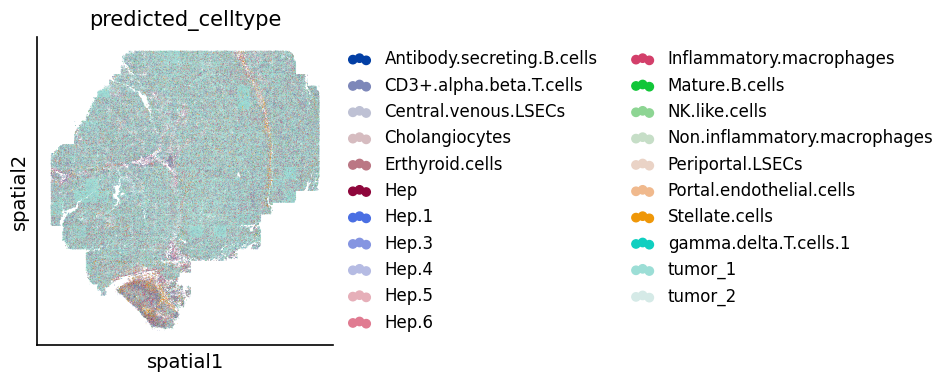

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


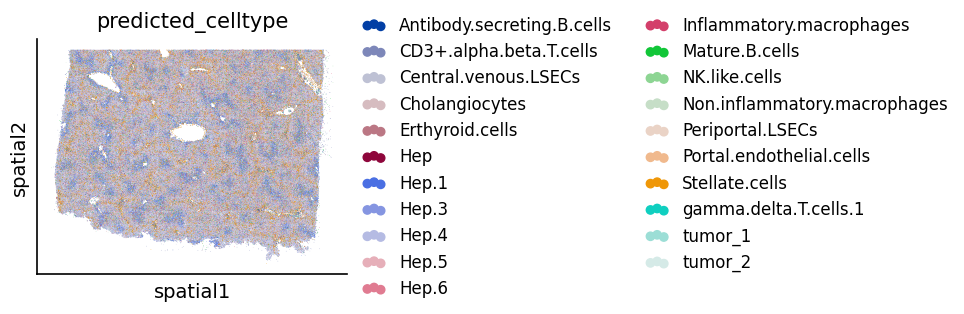

In [16]:
sc.pl.spatial(proseg[proseg.obs['health']=='cancer'], color='predicted_celltype', spot_size=0.02, alpha=1.0)
sc.pl.spatial(proseg[proseg.obs['health']=='normal'], color='predicted_celltype', spot_size=0.02, alpha=1.0)

In [17]:
proseg.obsm['X_resolvi'] = resolvi_transfer.get_latent_representation()

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


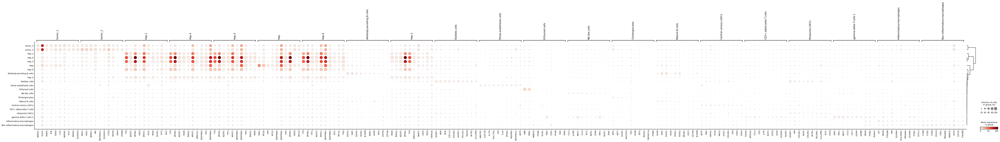

In [18]:
sc.tl.rank_genes_groups(proseg, groupby='predicted_celltype', method='wilcoxon', n_genes=10)
sc.pl.rank_genes_groups_dotplot(proseg, n_genes=10, groupby='predicted_celltype')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


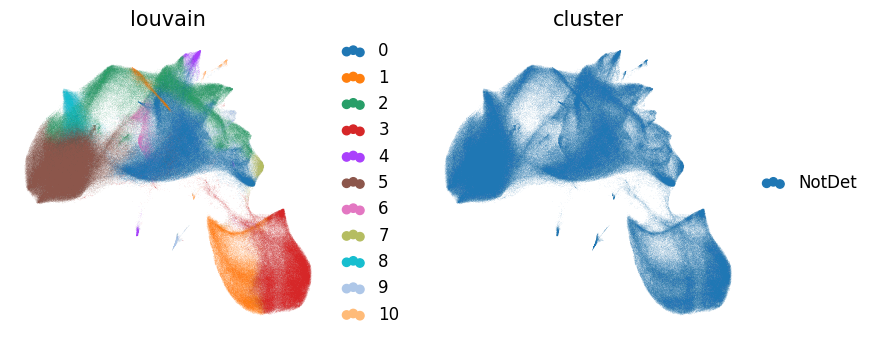

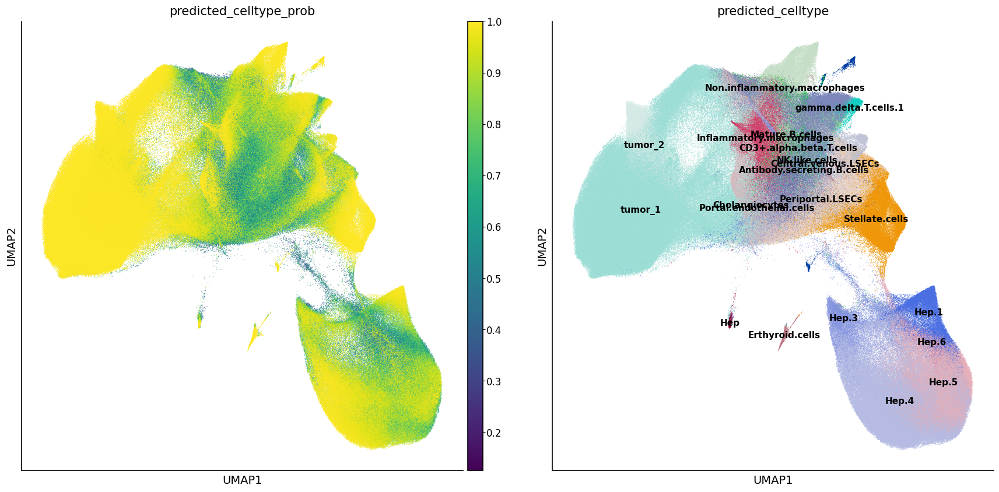

In [20]:
sys.path.append('/home/cane/Documents/yoseflab/can/resolvi_eval_final2')
import _utils
try:
    _utils.compute_umap_embedding(proseg, representation_key="X_resolvi", n_comps=None, show=True, n_neighbors=10, min_dist_umap=0.2, extra_save='transferred_latent')
except:
    with plt.rc_context({'figure.figsize': (10, 10)}):
        sc.pl.umap(proseg, color=['predicted_celltype_prob', 'predicted_celltype'], legend_loc='on data', size=2)

In [21]:
proseg.obsm['X_umap_transferred'] = proseg.obsm['X_umap']
proseg.obsm['X_resolvi_transferred'] = proseg.obsm['X_resolvi']

Sampling macro-batches, batch:   0%|          | 0/40 [00:00<?, ?it/s]

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


Sampling macro-batches, batch: 100%|██████████| 40/40 [21:52<00:00, 32.81s/it]


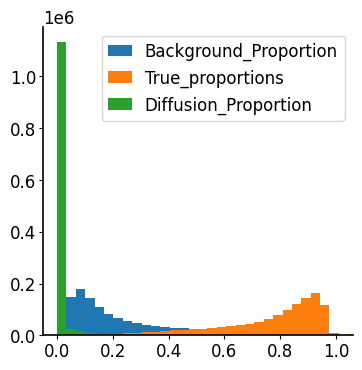

In [22]:
samples = resolvi_transfer.sample_posterior_predictive(
    model=resolvi_transfer.module.model_residuals,
    return_sites=['mixture_proportions'],
    num_samples=3, return_samples=False, batch_size=5000, macro_batch_size=30000)
samples = pd.DataFrame(samples).T

proseg.obs['true_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 0]
proseg.obs['diffusion_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 1]
proseg.obs['background_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 2]

_ = plt.hist(proseg.obs['background_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['true_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['diffusion_proportion_transfer'], bins=30, range=(0,1.01))
plt.legend(['Background_Proportion', 'True_proportions', 'Diffusion_Proportion'])
plt.savefig(f'baysor_histogram_proportions.pdf')
plt.show()

In [23]:
proseg.write_h5ad('nanostring_liver_baysor_processed.h5ad')

### Original

In [24]:
model_path = '/home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/original_newest_semisupervised_insitutype_newest/resolvae'
resolvi_semisupervised = RESOLVI.load(model_path)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/original_newest_semisupervised_insi
         tutype_newest/resolvae/model.pt already downloaded                                                        


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 0 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:05,  9.38it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:06,  7.92it/s, v_num=1]


In [25]:
proseg = sc.read_h5ad('nanostring_liver_original.h5ad')

In [26]:
proseg.X = csr(proseg.X)
proseg.layers['raw_counts'] = proseg.X.copy()

In [27]:
RESOLVI.prepare_query_anndata(proseg, model_path)
proseg = proseg[proseg.layers['raw_counts'].sum(1)>5].copy()

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/original_newest_semisupervised_insi
         tutype_newest/resolvae/model.pt already downloaded                                                        
INFO     Found 100.0% reference vars in query data.                                                                


In [28]:
proseg.obsm['X_spatial'] = proseg.obsm['spatial']

In [29]:
proseg = proseg[proseg.obs.groupby('fov_batch').filter(lambda x: len(x) >= 30).index]

In [35]:
proseg.obs['cluster'] = proseg.obs['cluster'].cat.rename_categories({'unassigned': 'NotDet'})
proseg.obs['cluster'].cat.categories

Index(['Antibody.secreting.B.cells', 'CD3+.alpha.beta.T.cells',
       'Central.venous.LSECs', 'Cholangiocytes', 'Erthyroid.cells', 'Hep',
       'Hep.1', 'Hep.3', 'Hep.4', 'Hep.5', 'Hep.6', 'Inflammatory.macrophages',
       'Mature.B.cells', 'NK.like.cells', 'Non.inflammatory.macrophages',
       'Periportal.LSECs', 'Portal.endothelial.cells', 'Stellate.cells',
       'gamma.delta.T.cells.1', 'tumor_1', 'tumor_2', 'NotDet'],
      dtype='object')

In [36]:
proseg.obs_names = ['query_' + i for i in proseg.obs_names]
resolvi_transfer = RESOLVI.load_query_data(
    proseg,
    model_path,
)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_nanostring/original_newest_semisupervised_insi
         tutype_newest/resolvae/model.pt already downloaded                                                        


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 793276 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:05,  8.33it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:06,  8.05it/s, v_num=1]


In [37]:
proseg.obsm['celltype_transfer'] = resolvi_transfer.predict(soft=True, num_samples=3, batch_size=5000)
proseg.obs['predicted_celltype'] = proseg.obsm['celltype_transfer'].idxmax(axis=1)
proseg.obs['predicted_celltype_prob'] = proseg.obsm['celltype_transfer'].max(axis=1)

Sampling macro-batches, batch:   0%|          | 0/16 [00:00<?, ?it/s]

Sampling macro-batches, batch: 100%|██████████| 16/16 [08:52<00:00, 33.27s/it]


In [38]:
pd.options.display.max_rows = 500

In [39]:
proseg.obs['patient'] = proseg.obs['slide_ID_numeric'].astype(str).map({str(i):'patient'+str(i) for i in range(1, 3)})

In [40]:
proseg.obs['patient'].value_counts(), proseg.obs['slide_ID_numeric'].value_counts()

(patient2    460441
 patient1    332835
 Name: patient, dtype: int64,
 2    460441
 1    332835
 Name: slide_ID_numeric, dtype: int64)

In [41]:
proseg.obs['predicted_celltype'].value_counts()

tumor_1                         352995
Hep.4                           127016
Hep.5                            92294
CD3+.alpha.beta.T.cells          37000
tumor_2                          32626
Stellate.cells                   25071
Inflammatory.macrophages         20705
Hep.3                            19972
Non.inflammatory.macrophages     19172
Periportal.LSECs                 19170
Hep.1                            18434
Central.venous.LSECs              5937
Cholangiocytes                    5930
Mature.B.cells                    5654
gamma.delta.T.cells.1             2818
Antibody.secreting.B.cells        2639
NK.like.cells                     1911
Hep.6                             1653
Hep                               1202
Erthyroid.cells                   1077
Name: predicted_celltype, dtype: int64

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


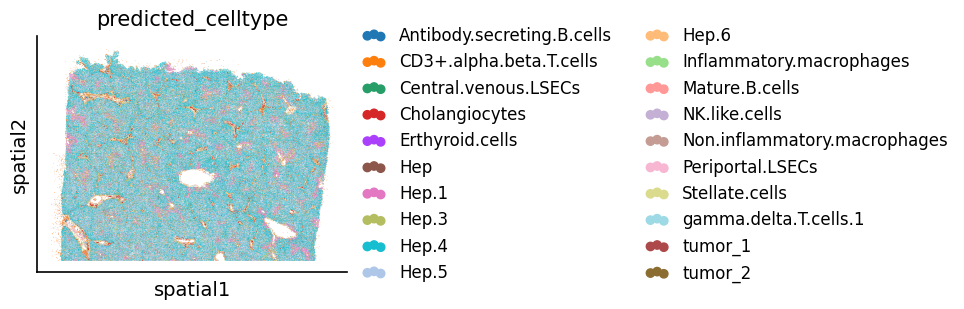

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


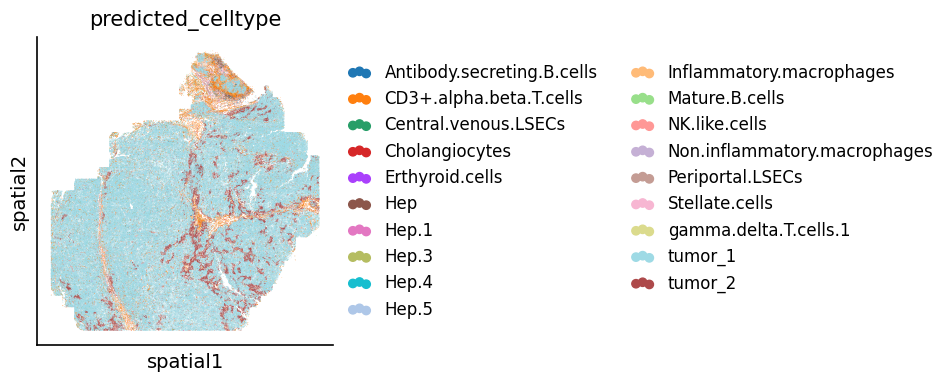

In [42]:
sc.pl.spatial(proseg[proseg.obs['patient']=='patient1'], color='predicted_celltype', spot_size=0.02, alpha=1.0)
sc.pl.spatial(proseg[proseg.obs['patient']=='patient2'], color='predicted_celltype', spot_size=0.02, alpha=1.0)

In [43]:
proseg.obsm['X_resolvi'] = resolvi_transfer.get_latent_representation()

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


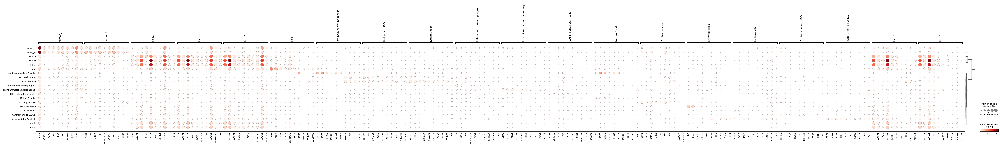

In [44]:
sc.tl.rank_genes_groups(proseg, groupby='predicted_celltype', method='wilcoxon', n_genes=10)
sc.pl.rank_genes_groups_dotplot(proseg, n_genes=10, groupby='predicted_celltype')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


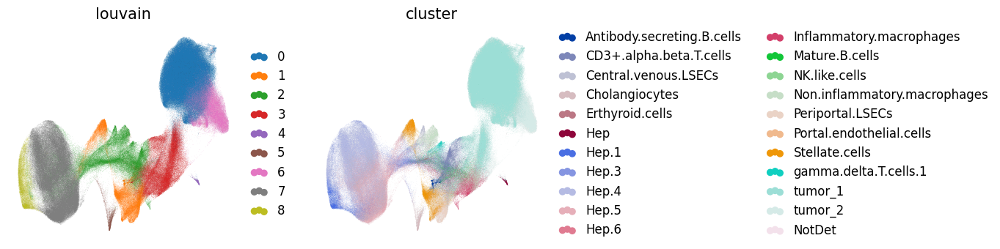

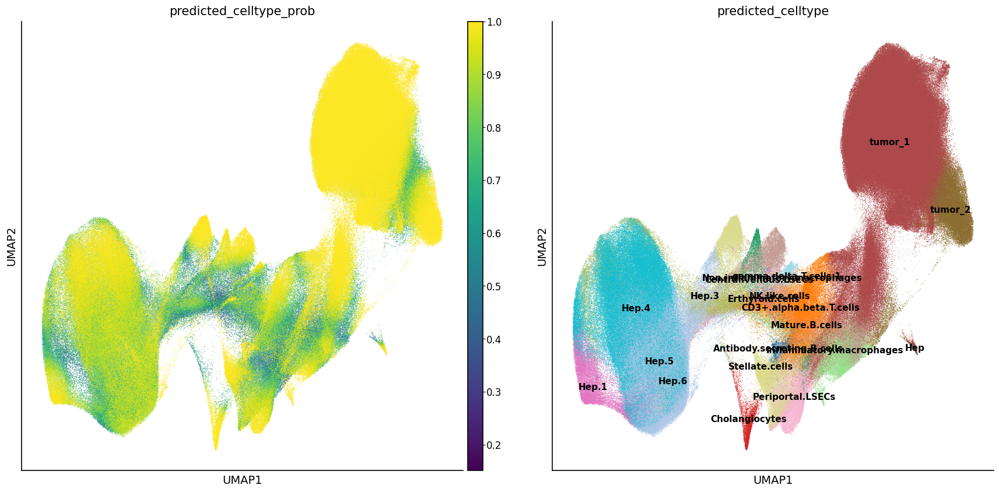

In [45]:
sys.path.append('/home/cane/Documents/yoseflab/can/resolvi_eval_final2')
import _utils
try:
    _utils.compute_umap_embedding(proseg, representation_key="X_resolvi", n_comps=None, show=True, n_neighbors=10, min_dist_umap=0.2, extra_save='transferred_latent')
except:
    with plt.rc_context({'figure.figsize': (10, 10)}):
        sc.pl.umap(proseg, color=['predicted_celltype_prob', 'predicted_celltype'], legend_loc='on data', size=2)

In [46]:
proseg.obsm['X_umap_transferred'] = proseg.obsm['X_umap']
proseg.obsm['X_resolvi_transferred'] = proseg.obsm['X_resolvi']

Sampling macro-batches, batch:  15%|█▍        | 4/27 [00:57<05:26, 14.20s/it]

Sampling macro-batches, batch: 100%|██████████| 27/27 [09:02<00:00, 20.08s/it]


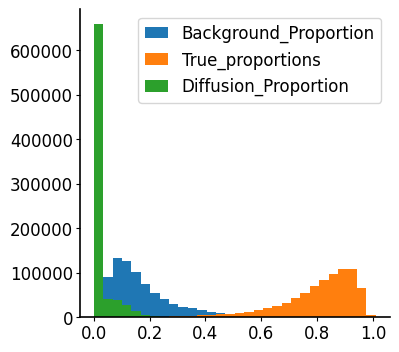

In [47]:
samples = resolvi_transfer.sample_posterior_predictive(
    model=resolvi_transfer.module.model_residuals,
    return_sites=['mixture_proportions'],
    num_samples=3, return_samples=False, batch_size=5000, macro_batch_size=30000)
samples = pd.DataFrame(samples).T

proseg.obs['true_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 0]
proseg.obs['diffusion_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 1]
proseg.obs['background_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 2]

_ = plt.hist(proseg.obs['background_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['true_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['diffusion_proportion_transfer'], bins=30, range=(0,1.01))
plt.legend(['Background_Proportion', 'True_proportions', 'Diffusion_Proportion'])
plt.savefig(f'original_histogram_proportions.pdf')
plt.show()

In [ ]:
proseg.write_h5ad('nanostring_liver_original_processed.h5ad')